<a href="https://colab.research.google.com/github/stefan9988/BlackJack_Q_learning/blob/main/Building_Mapping.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Building Mapping


In [ ]:
# import necessary libraries
import glob
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import random
import tifffile as tiff
from PIL import Image
import cv2

import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint
# from tensorflow.keras import Model
# from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, Concatenate, Dropout

In [ ]:
# connect google drive
from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# set the working directory
import os
os.chdir(r'/content/gdrive/MyDrive/archive')

## Data preprocessing

In [ ]:
train_x = sorted(glob.glob('train/*_image.tif'))
train_y = sorted(glob.glob('train/*_label.tif'))
test_x = sorted(glob.glob('test/*_image.tif'))
test_y = sorted(glob.glob('test/*_label.tif'))

print(len(train_x), len(test_x))

70 30


In [ ]:
# converting training images to numpy array
train_xx = np.zeros((70, 128, 128, 3))
train_yy = np.zeros((70, 128, 128, 1))
for i, (img, mask) in enumerate(zip(train_x, train_y)):
  # if i == 1:
  #   break

  img = Image.open(img)
  np_img = np.array(img)
  train_xx[i] = np_img

  mask = Image.open(mask)
  np_mask = np.array(mask).reshape(128, 128, 1)
  train_yy[i] = np_mask

In [ ]:
# converting test images to numpy array
test_xx = np.zeros((30, 128, 128, 3))
test_yy = np.zeros((30, 128, 128, 1))
for i, (img, mask) in enumerate(zip(test_x, test_y)):

  img = Image.open(img)
  np_img = np.array(img)
  test_xx[i] = np_img

  mask = Image.open(mask)
  np_mask = np.array(mask).reshape(128, 128, 1)
  test_yy[i] = np_mask

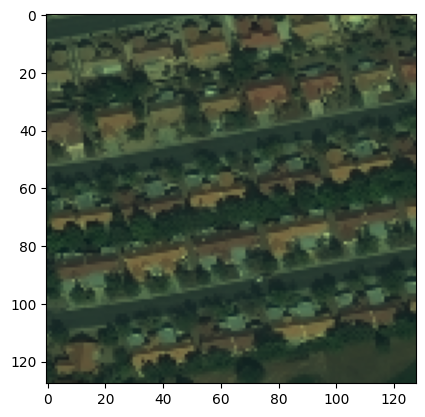

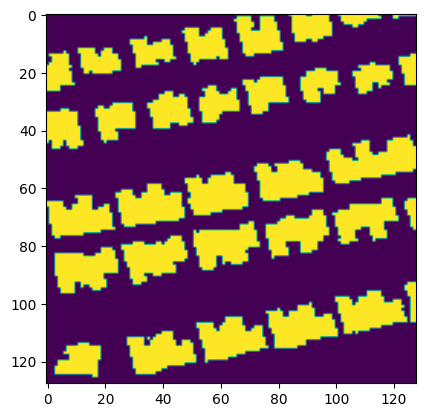

In [ ]:
plt.imshow(train_xx[20, :, :, :].astype('uint8'))
plt.show()
plt.imshow(train_yy[20, :, :, 0].astype('uint8'))
plt.show()

## Image augmentation

In [ ]:
def augment_image(image_1, image_2, flip=True, rotate=True, zoom=True):
    # Flip the image horizontally
    if flip:
        image_1 = cv2.flip(image_1, 1)
        image_2 = cv2.flip(image_2, 1)
        image_2 = image_2[:, :, np.newaxis]

    # Rotate the image by a random angle between -45 and 45 degrees
    if rotate:
        angle = np.random.uniform(-45, 45)

        rows, cols, _ = image_1.shape
        rotation_matrix = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)
        image_1 = cv2.warpAffine(image_1, rotation_matrix, (cols, rows))

        rows, cols, _ = image_2.shape
        rotation_matrix = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)
        image_2 = cv2.warpAffine(image_2, rotation_matrix, (cols, rows))
        image_2 = image_2[:, :, np.newaxis]

    # Zoom into the image by a random factor between 1.0 and 1.5
    if zoom:
        zoom_factor = np.random.uniform(1.0, 1.5)

        rows, cols, _ = image_1.shape
        zoom_matrix = np.array([[zoom_factor, 0, (1 - zoom_factor) * cols / 2],
                                [0, zoom_factor, (1 - zoom_factor) * rows / 2]])
        image_1 = cv2.warpAffine(image_1, zoom_matrix, (cols, rows))

        rows, cols, _ = image_2.shape
        zoom_matrix = np.array([[zoom_factor, 0, (1 - zoom_factor) * cols / 2],
                                [0, zoom_factor, (1 - zoom_factor) * rows / 2]])
        image_2 = cv2.warpAffine(image_2, zoom_matrix, (cols, rows))
        image_2 = image_2[:, :, np.newaxis]

    return image_1, image_2

In [ ]:
augmented_image_1, augmented_image_2 = augment_image(train_xx[20, :, :, :], train_yy[20, :, :, :], 1,1,1)

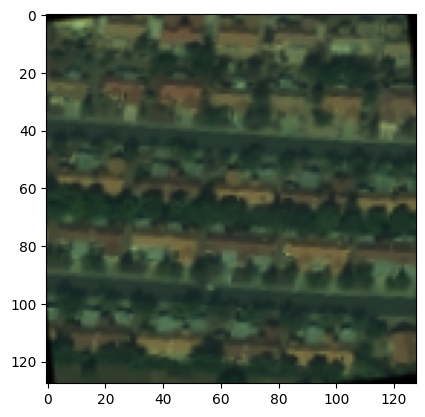

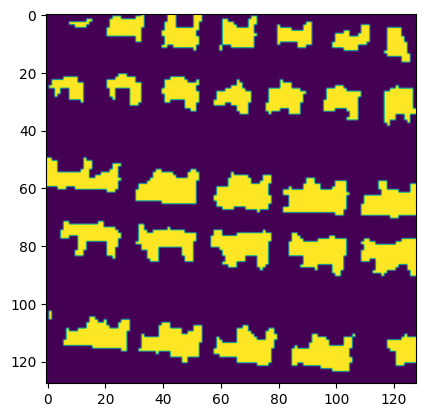

In [ ]:
plt.imshow(augmented_image_1.astype('uint8'))
plt.show()
plt.imshow(augmented_image_2.astype('uint8'))
plt.show()

In [ ]:
n=500
augmented_train_xx = np.zeros((n,128,128,3))
augmented_train_yy = np.zeros((n,128,128,1))

for i in range(n):
  img_number = random.randint(0, 69)
  augmented_image_1, augmented_image_2 = augment_image(train_xx[img_number, :, :, :], train_yy[img_number, :, :, :], random.choice([0, 1]),random.choice([0, 1]),random.choice([0, 1]))
  augmented_train_xx[i,:,:,:] = augmented_image_1
  augmented_train_yy[i,:,:,:] = augmented_image_2

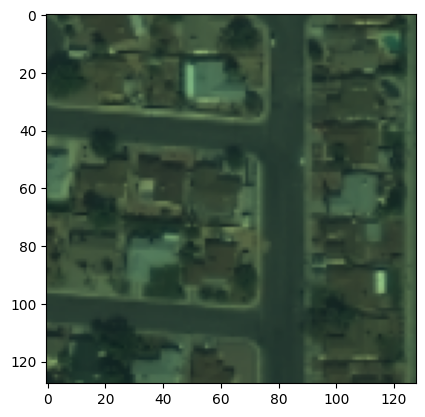

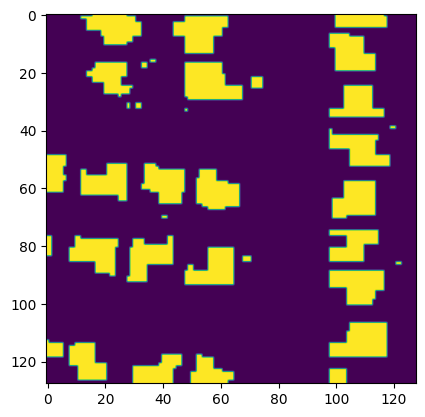

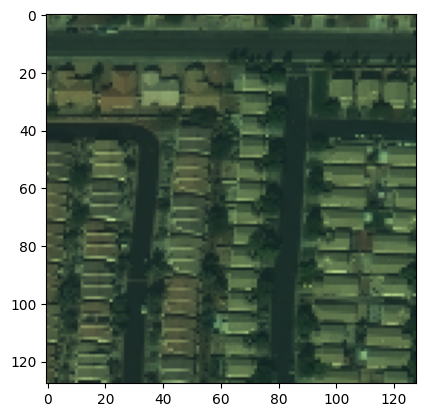

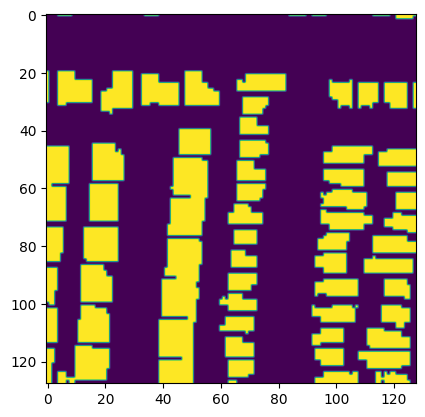

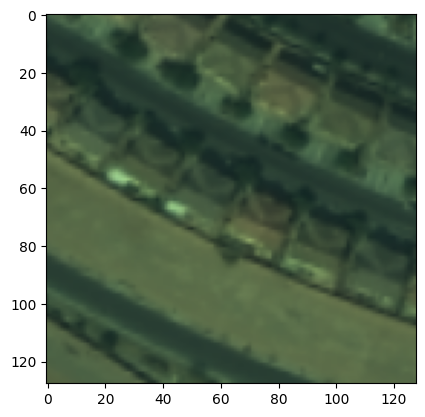

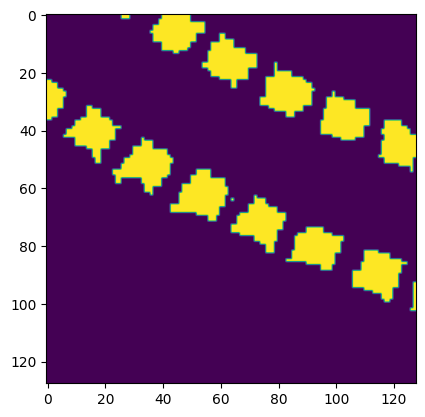

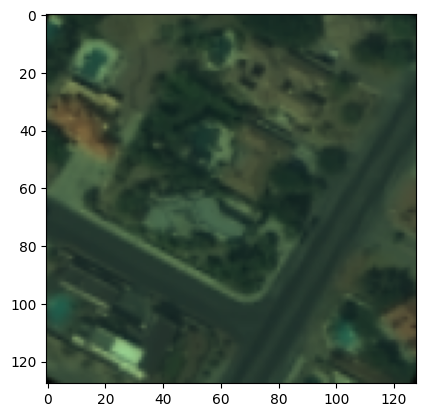

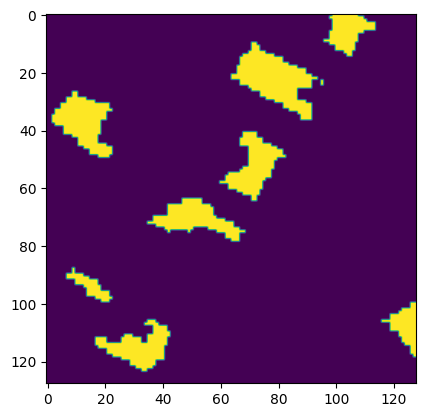

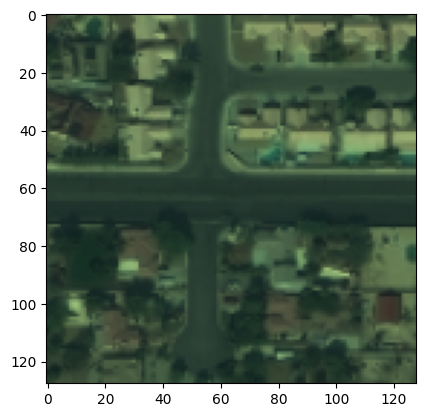

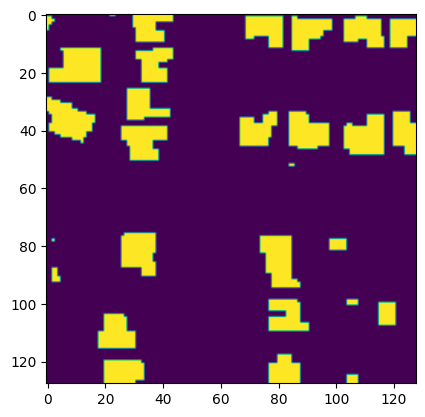

In [ ]:
for i in range(0,500,100):
  plt.imshow(augmented_train_xx[i, :, :, :].astype('uint8'))
  plt.show()
  plt.imshow(augmented_train_yy[i, :, :, 0].astype('uint8'))
  plt.show()

## Create model

In [ ]:
def create_model():
  x_in = tf.keras.layers.Input(shape=(128, 128, 3))

  '''Encoder'''
  x_temp = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x_in)
  x_temp = tf.keras.layers.Dropout(0.25)(x_temp)
  x_skip1 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.MaxPooling2D((2,2))(x_skip1)
  x_temp = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.25)(x_temp)
  x_skip2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.MaxPooling2D((2,2))(x_skip2)
  x_temp = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.25)(x_temp)
  x_skip3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.MaxPooling2D((2,2))(x_skip3)
  x_temp = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.5)(x_temp)
  x_temp = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x_temp)

  '''Decoder'''
  x_temp = tf.keras.layers.Conv2DTranspose(64, (3, 3), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.5)(x_temp)
  x_temp = tf.keras.layers.Conv2DTranspose(64, (3, 3), strides=(2, 2), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Concatenate()([x_temp, x_skip3])
  x_temp = tf.keras.layers.Conv2DTranspose(64, (3, 3), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.5)(x_temp)
  x_temp = tf.keras.layers.Conv2DTranspose(64, (3, 3), strides=(2, 2), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Concatenate()([x_temp, x_skip2])
  x_temp = tf.keras.layers.Conv2DTranspose(32, (3, 3), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.5)(x_temp)
  x_temp = tf.keras.layers.Conv2DTranspose(32, (3, 3), strides=(2, 2), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Concatenate()([x_temp, x_skip1])
  x_temp = tf.keras.layers.Conv2DTranspose(32, (3, 3), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.5)(x_temp)
  x_temp = tf.keras.layers.Conv2DTranspose(32, (3, 3), activation='relu',  padding='same')(x_temp)

  '''Use 1 by 1 Convolution to get desired output bands'''
  x_temp = tf.keras.layers.Conv2D(32, (1, 1), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.Conv2D(32, (1, 1), activation='relu', padding='same')(x_temp)
  x_out = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same')(x_temp)
  # use sigmoid activation here because output values are either 0 or 1

  model = tf.keras.models.Model(inputs=x_in, outputs=x_out)

  return model

In [ ]:
model = create_model()

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 32)         896       ['input_1[0][0]']             
                                                                                                  
 dropout (Dropout)           (None, 128, 128, 32)         0         ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 128, 128, 32)         9248      ['dropout[0][0]']             
                                                                                              

In [ ]:
model.compile(loss='binary_crossentropy', optimizer='adam')

In [ ]:
checkpoint_callback = ModelCheckpoint(
    filepath='best_test_model_weights_no_aug.h5',
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

In [ ]:
# training model
# history = model.fit(augmented_train_xx, augmented_train_yy, validation_data=(test_xx, test_yy), epochs=150, batch_size=50, callbacks=[checkpoint_callback], verbose=1)
history = model.fit(train_xx, train_yy, validation_data=(test_xx, test_yy), epochs=125, batch_size=10, callbacks=[checkpoint_callback], verbose=1)

Epoch 1/125
7/7 [==============================] - ETA: 0s - loss: 1.8730
Epoch 1: val_loss improved from inf to 0.60659, saving model to best_test_model_weights_no_aug.h5
7/7 [==============================] - 13s 2s/step - loss: 1.8730 - val_loss: 0.6066
Epoch 2/125


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - ETA: 0s - loss: 0.6225
Epoch 2: val_loss improved from 0.60659 to 0.60074, saving model to best_test_model_weights_no_aug.h5
7/7 [==============================] - 10s 2s/step - loss: 0.6225 - val_loss: 0.6007
Epoch 3/125
7/7 [==============================] - ETA: 0s - loss: 0.5765
Epoch 3: val_loss improved from 0.60074 to 0.53568, saving model to best_test_model_weights_no_aug.h5
7/7 [==============================] - 11s 2s/step - loss: 0.5765 - val_loss: 0.5357
Epoch 4/125
7/7 [==============================] - ETA: 0s - loss: 0.5317
Epoch 4: val_loss improved from 0.53568 to 0.49368, saving model to best_test_model_weights_no_aug.h5
7/7 [==============================] - 10s 2s/step - loss: 0.5317 - val_loss: 0.4937
Epoch 5/125
7/7 [==============================] - ETA: 0s - loss: 0.5001
Epoch 5: val_loss improved from 0.49368 to 0.44325, saving model to best_test_model_weights_no_aug.h5
7/7 [==============================] - 11s 2s/step - 

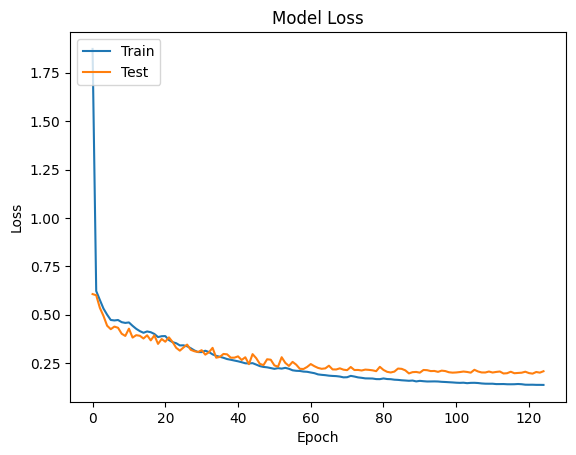

In [ ]:
# plot model loss over training and validation data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Prediction

1/1 [==============================] - 0s 355ms/step
(30, 128, 128, 1)


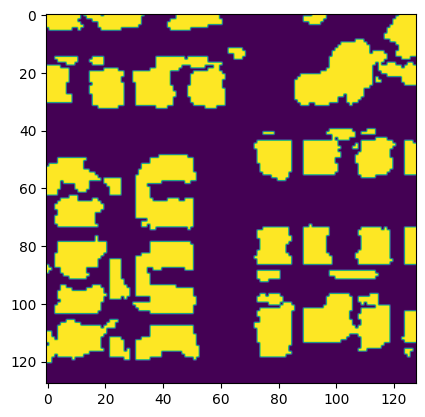

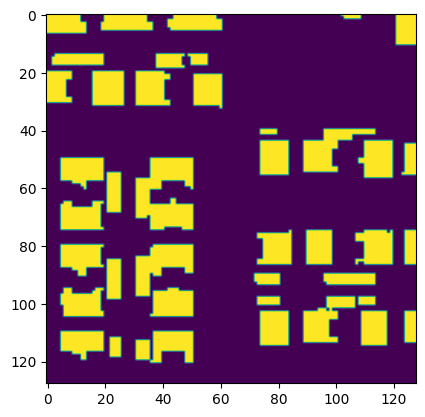

In [ ]:
threshold = 0.5
im = 12

# prediction of the output
pred_test = model.predict(test_xx)
pred_test = (pred_test > threshold).astype(np.uint8)
print(pred_test.shape)

#let's comare random predicted and actial y values
plt.imshow(pred_test[im, :, :, 0])
plt.show()
plt.imshow(test_yy[im,:,:,0])
plt.show()

## Main Model Training

In [ ]:
xx = result = np.concatenate((train_xx, test_xx), axis=0)
yy = result = np.concatenate((train_yy, test_yy), axis=0)

In [ ]:
n=5000
augmented_xx = np.zeros((n,128,128,3))
augmented_yy = np.zeros((n,128,128,1))

for i in range(n):
  img_number = random.randint(0, 99)
  augmented_image_1, augmented_image_2 = augment_image(xx[img_number, :, :, :], yy[img_number, :, :, :], random.choice([0, 1]),random.choice([0, 1]),random.choice([0, 1]))
  augmented_xx[i,:,:,:] = augmented_image_1
  augmented_yy[i,:,:,:] = augmented_image_2

In [ ]:
checkpoint_callback = ModelCheckpoint(
    filepath='best_model_weights.h5',
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

In [ ]:
model = create_model()
model.compile(loss='binary_crossentropy', optimizer='adam')

In [ ]:
# training model
history = model.fit(augmented_xx[:4750,:,:,:], augmented_yy[:4750,:,:,:], validation_data=(augmented_xx[4750:,:,:,:], augmented_yy[4750:,:,:,:]), epochs=250, batch_size=50, callbacks=[checkpoint_callback], verbose=1)

Epoch 1/250
95/95 [==============================] - ETA: 0s - loss: 0.5415
Epoch 1: val_loss improved from inf to 0.41404, saving model to best_model_weights.h5
95/95 [==============================] - 28s 244ms/step - loss: 0.5415 - val_loss: 0.4140
Epoch 2/250
95/95 [==============================] - ETA: 0s - loss: 0.3681
Epoch 2: val_loss improved from 0.41404 to 0.30991, saving model to best_model_weights.h5
95/95 [==============================] - 23s 240ms/step - loss: 0.3681 - val_loss: 0.3099
Epoch 3/250
95/95 [==============================] - ETA: 0s - loss: 0.2877
Epoch 3: val_loss improved from 0.30991 to 0.26945, saving model to best_model_weights.h5
95/95 [==============================] - 22s 234ms/step - loss: 0.2877 - val_loss: 0.2694
Epoch 4/250
95/95 [==============================] - ETA: 0s - loss: 0.2433
Epoch 4: val_loss improved from 0.26945 to 0.23729, saving model to best_model_weights.h5
95/95 [==============================] - 22s 232ms/step - loss: 0.2433

In [ ]:
# plot model loss over training and validation data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

NameError: name 'plt' is not defined

## NS image


In [ ]:
# Assuming you have the path to the image stored in 'ns'
ns_path = '/content/gdrive/MyDrive/archive/SnimakNS.tif'

# Load the image using PIL
img = tiff.imread(ns_path)

# Convert the image to a NumPy array
ns_array = np.array(img)

# Print the shape, minimum, and maximum values
print("Shape of the array:", ns_array.shape)
print("Minimum value:", np.min(ns_array))
print("Maximum value:", np.max(ns_array))

Shape of the array: (5911, 10657, 5)
Minimum value: 0
Maximum value: 255


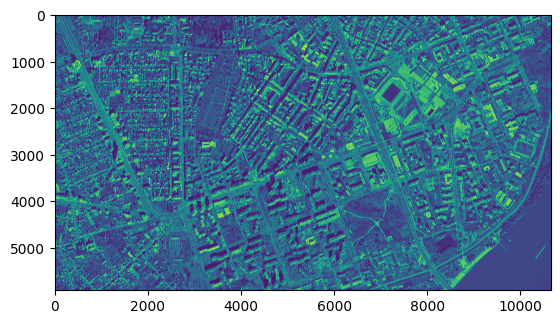

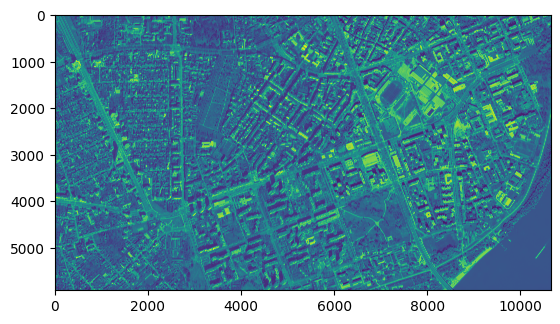

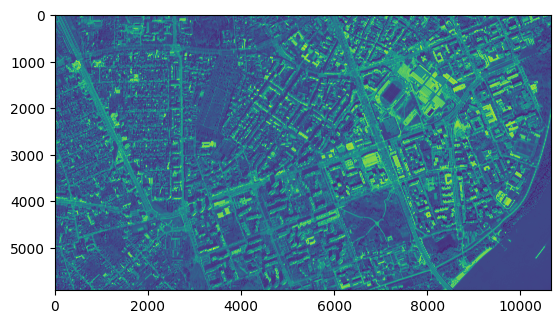

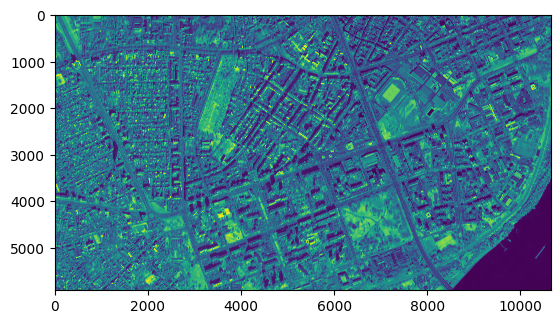

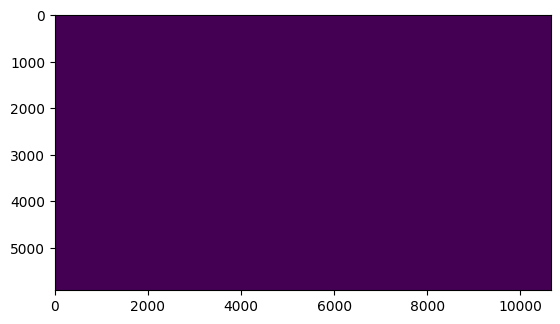

In [ ]:
for i in range(5):
  plt.imshow(ns_array[:, :, i])
  plt.show()

# 5 ti kanal ima vrednost 255 za svaki piksel

In [ ]:
def split_image(input_image_path, size=128):
    img = tiff.imread(input_image_path)
    height, width, num_channels = img.shape

    num_rows = height // size
    num_cols = width // size

    result_array = np.zeros((num_rows * num_cols, size, size, num_channels), dtype=img.dtype)

    idx = 0
    for row in range(num_rows):
        for col in range(num_cols):
            left = col * size
            top = row * size
            right = left + size
            bottom = top + size

            for channel in range(num_channels):
                cropped_img = img[top:bottom, left:right, channel]
                result_array[idx, :, :, channel] = cropped_img

            # plt.imshow(result_array[idx,:,:,:3])
            # plt.show()
            idx += 1

    return result_array[:,:,:,:3],num_rows,num_cols

In [ ]:
def reconstruct_image(result_array, num_rows, num_cols, size=128):
    num_samples, size, _, num_channels = result_array.shape

    reconstructed_image = np.zeros((num_rows * size, num_cols * size, num_channels), dtype=result_array.dtype)

    idx = 0
    for row in range(num_rows):
        for col in range(num_cols):
            left = col * size
            top = row * size
            right = left + size
            bottom = top + size

            for channel in range(num_channels):
                cropped_img = result_array[idx, :, :, channel]
                reconstructed_image[top:bottom, left:right, channel] = cropped_img

            idx += 1

    return reconstructed_image

In [ ]:
def save_img(sample_array,img_name,grayscale = False):
  if grayscale:
    sample_array = sample_array * 255
    image = Image.fromarray(sample_array.squeeze(), mode='L')
  else:
    image = Image.fromarray(sample_array.astype('uint8'))

  image.save(f'{img_name}.png')

In [ ]:
ns_splited,num_rows,num_cols = split_image(ns_path)
print(ns_splited.shape)

(3818, 128, 128, 3)


In [ ]:
model = create_model()
model.load_weights('best_test_model_weights_no_aug.h5')

In [ ]:
threshold = 0.5

# prediction of the output
pred_ns = model.predict(ns_splited)
pred_ns = (pred_ns > threshold).astype(np.uint8)

120/120 [==============================] - 153s 1s/step


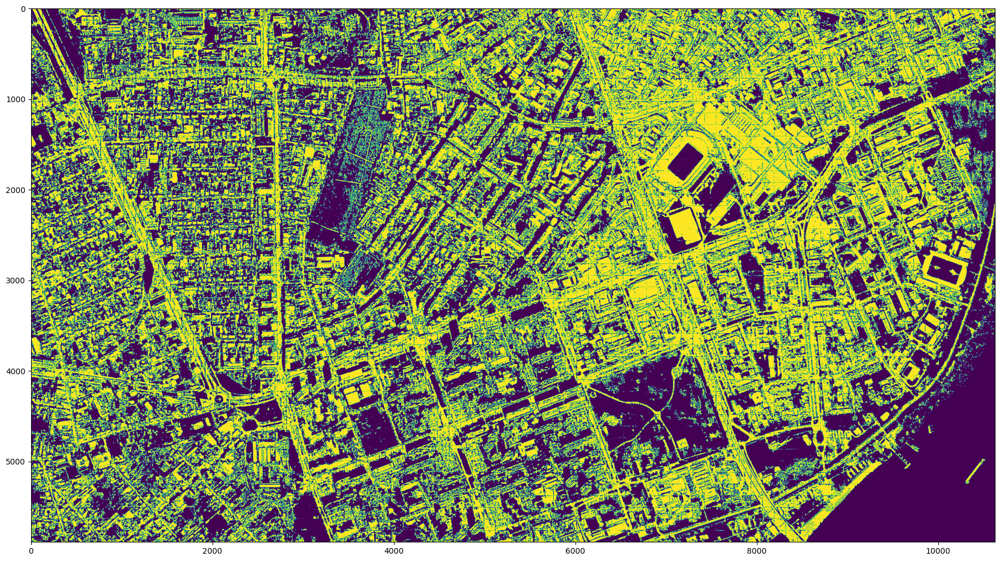

In [ ]:
reconstructed_image = reconstruct_image(pred_ns,num_rows,num_cols)
plt.figure(figsize=(22, 20))
plt.imshow(reconstructed_image)
plt.show()
# save_img(reconstructed_image,'NS_th_05', True)

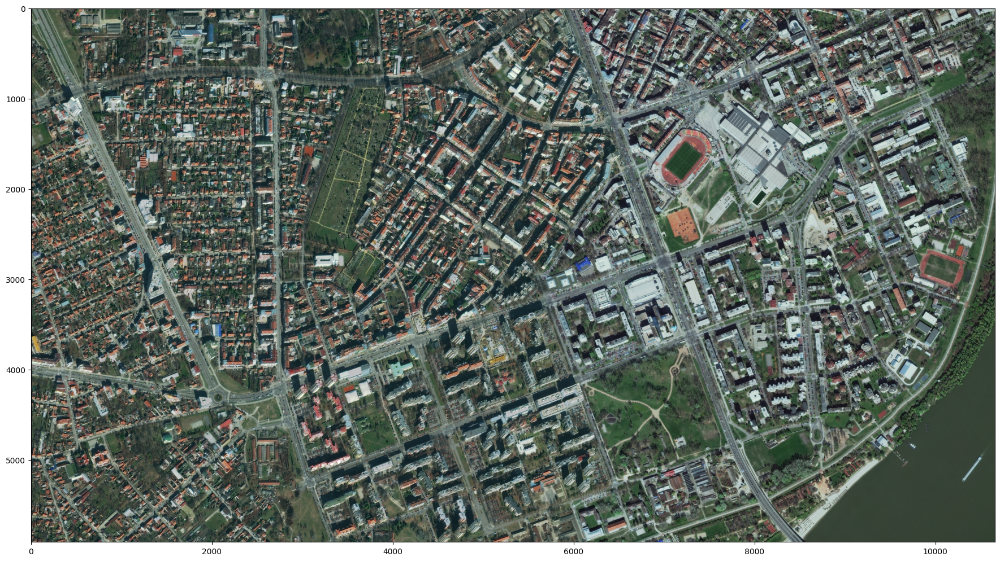

In [ ]:
plt.figure(figsize=(22, 20))
plt.imshow(ns_array[:, :, :3])
plt.show()
# save_img(ns_array[:, :, :3],'NS_RGB')